### Tarefas :)
- missing values - ines  5)
- outliers - isa     6)
- inconsistencias - ir pondo   2)
- feature selection - ines    8)  
<p><s>- tipos de variáveis - joana  1)</s></p>
<p><s>- PCA - joana    11)</s></p>
- fazer variáveis novas - ines      4)
- gráficos, histogramas, correlações - isa  3)
- heatmap -isa      7)
- relatório lmao - todas :D
<p><s>- scale data,</s></p>
- ordinal encoder    9)
<p><s>- dummify - joana    10)</s></p>
- 

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# Table of Contents
   
</div>

1. [Imports](#Imports)
2. [Load Datasets](#Load_Datasets)
<!--     1. [Sub paragraph](#subparagraph1) -->
3. [Data Exploration](#Exploration)
4. [Data Cleaning](#Cleaning)
5. [Feature Selection](#Feature_Selection)
6. [Models](#Models)
7. [Comparison and Model Choice](#Comparison_Model)
8. [Prepare Test Data](#Prepare_Test)

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 1. Imports
    
<a name="Imports"></a>  
</div>

In [1]:
#!pip install pyreadstat

In [2]:
import numpy as np
import pandas as pd
import pyreadstat
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import numpy as np
import warnings
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
warnings.filterwarnings('ignore')

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 2. Load Datasets
    
<a name="Load_Datasets"></a>  
</div>

In [3]:
df, meta = pyreadstat.read_sas7bdat('a2z_insurance.sas7bdat')

In [4]:
df.head()

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,2 - High School,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,1 - Basic,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,3 - BSc/MSc,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [5]:
#Check for dupicate rows
df['CustID'].nunique()

10296

In [6]:
df.set_index('CustID', inplace = True)

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 3. Data Exploration
    
<a name="Exploration"></a>  
</div>

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10296 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


From here we can see that some variables are keep as float although thats is not the most appropiate variable type for them. We are going to correct them now so we can explore the data easier. We can also see that we have a lot of variables with missing values.

In [8]:
df.isnull().sum()

FirstPolYear      30
BirthYear         17
EducDeg            0
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

### Changing Data Types

The variables <code>BirthYear</code>, <code>FirstPolYear</code>, <code>GeoLivArea</code> and <code>Children</code> are discrete, so they should be integers. For each variable we are going to first verify there is no value that might have been mistyped and has decimal cases.

In [9]:
df[(round(df['BirthYear']) != df['BirthYear'])]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
420.0,1987.0,NaN,2 - High School,3219.0,1.0,1.0,379.30,0.33,404.52,42.80,152.25,7.78,-0.11
756.0,NaN,NaN,4 - PhD,2913.0,3.0,0.0,430.20,0.28,465.20,59.45,94.13,4.89,10.00
1874.0,1995.0,NaN,1 - Basic,517.0,1.0,1.0,-238.93,1.19,63.68,692.90,98.13,151.14,126.47
1929.0,1983.0,NaN,2 - High School,2426.0,4.0,1.0,163.80,0.74,286.83,158.35,181.48,72.57,30.45
2562.0,1976.0,NaN,2 - High School,3253.0,1.0,1.0,-44.44,1.03,298.61,13.90,191.37,49.01,33.34
2706.0,1978.0,NaN,3 - BSc/MSc,3614.0,4.0,0.0,356.96,0.54,381.96,274.50,117.91,35.45,12.89
3182.0,1987.0,NaN,2 - High School,3954.0,2.0,0.0,-25.00,1.00,233.60,206.70,265.94,36.45,21.67
3284.0,1983.0,NaN,3 - BSc/MSc,2433.0,1.0,1.0,289.06,0.52,321.84,83.90,238.60,3.89,3.89
3761.0,NaN,NaN,2 - High School,2067.0,1.0,1.0,-47.67,1.04,495.87,58.90,61.90,22.67,3.78


In [10]:
df['BirthYear'] = df['BirthYear'].astype('Int32')
df['BirthYear'].dtype

Int32Dtype()

In [11]:
#see if there are any years in which the value is a float (has decimals) - which would be an inconsistency
df[(round(df['FirstPolYear']) != df['FirstPolYear'])]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
297.0,NaN,1955,4 - PhD,3591.0,NaN,NaN,-49.11,1.04,447.64,-25.00,130.58,0.89,12.89
756.0,NaN,<NA>,4 - PhD,2913.0,3.0,0.0,430.20,0.28,465.20,59.45,94.13,4.89,10.00
897.0,NaN,1960,,2643.0,1.0,1.0,-25.00,1.00,515.54,33.90,47.01,12.89,3.78
2228.0,NaN,1979,3 - BSc/MSc,1987.0,2.0,NaN,429.87,0.25,376.85,33.90,154.25,39.34,4.78
2450.0,NaN,1939,,4465.0,4.0,0.0,457.75,0.36,338.73,187.25,175.81,43.23,4.78
2704.0,NaN,1977,1 - Basic,2105.0,2.0,NaN,302.62,0.54,299.28,167.25,162.92,28.34,51.01
2729.0,NaN,1954,,3200.0,2.0,0.0,109.25,0.77,211.93,14.45,275.72,77.68,11.67
2771.0,NaN,1984,,1473.0,4.0,1.0,443.74,0.31,386.74,104.45,156.92,5.00,27.45
2927.0,NaN,1982,3 - BSc/MSc,1817.0,2.0,NaN,420.32,0.26,466.42,-10.55,112.91,12.89,16.89


In [12]:
df['FirstPolYear'] = df['FirstPolYear'].astype('Int32')
df['FirstPolYear'].dtype

Int32Dtype()

In [13]:
#see if there are any geograhic areas in which the value is a float (has decimals)
df[(round(df['GeoLivArea']) != df['GeoLivArea'])]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
297.0,<NA>,1955,4 - PhD,3591.0,NaN,NaN,-49.11,1.04,447.64,-25.0,130.58,0.89,12.89


In [14]:
df['GeoLivArea'] = df['GeoLivArea'].astype('Int32')
df['GeoLivArea'].dtype

Int32Dtype()

In [15]:
#see if there are any children in which the value is a float (has decimals)
df[(round(df['Children']) != df['Children'])]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
297.0,<NA>,1955,4 - PhD,3591.0,<NA>,NaN,-49.11,1.04,447.64,-25.00,130.58,0.89,12.89
620.0,1980,1994,3 - BSc/MSc,1333.0,2,NaN,312.52,0.40,286.83,-6.10,175.70,52.90,56.79
773.0,1998,1949,2 - High School,3601.0,2,NaN,27.01,0.94,104.91,308.95,285.61,64.90,52.90
2228.0,<NA>,1979,3 - BSc/MSc,1987.0,2,NaN,429.87,0.25,376.85,33.90,154.25,39.34,4.78
2363.0,1981,1975,2 - High School,1607.0,2,NaN,271.51,0.64,292.61,308.40,159.14,11.89,59.68
2672.0,1992,1988,2 - High School,1140.0,2,NaN,356.40,0.54,168.03,265.60,273.94,68.79,52.23
2704.0,<NA>,1977,1 - Basic,2105.0,2,NaN,302.62,0.54,299.28,167.25,162.92,28.34,51.01
2927.0,<NA>,1982,3 - BSc/MSc,1817.0,2,NaN,420.32,0.26,466.42,-10.55,112.91,12.89,16.89
3178.0,1980,1975,3 - BSc/MSc,2647.0,2,NaN,392.19,0.37,404.41,107.25,110.80,24.56,12.78


In [16]:
df['Children'] = df['Children'].astype('Int32')
df['Children'].dtype

Int32Dtype()

### Continuing with data exploration

In [17]:
df.describe()

,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
count,10266.000000,10279.000000,10260.000000,10295.000000,10275.000000,10296.000000,10296.000000,10262.000000,10296.000000,10253.000000,10192.000000,10210.000000
mean,1991.062634,1968.007783,2506.667057,2.709859,0.706764,177.892605,0.742772,300.470252,210.431192,171.580833,41.855782,41.277514
std,511.267913,19.709476,1157.449634,1.266291,0.455268,1945.811505,2.916964,211.914997,352.595984,296.405976,47.480632,51.513572
min,1974.000000,1028.000000,333.000000,1.000000,0.000000,-165680.420000,0.000000,-4.110000,-75.000000,-2.110000,-7.000000,-12.000000
25%,1980.000000,1953.000000,1706.000000,1.000000,0.000000,-9.440000,0.390000,190.590000,49.450000,111.800000,9.890000,10.670000
50%,1986.000000,1968.000000,2501.500000,3.000000,1.000000,186.870000,0.720000,298.610000,132.800000,162.810000,25.560000,25.670000
75%,1992.000000,1983.000000,3290.250000,4.000000,1.000000,399.777500,0.980000,408.300000,290.050000,219.820000,57.790000,56.790000
max,53784.000000,2001.000000,55215.000000,4.000000,1.000000,11875.890000,256.200000,11604.420000,25048.800000,28272.000000,398.300000,1988.700000


The variable <code>BirthYear</code> has an impossible minimum value. The variable <code>FirstPolYear</code> also has a impossible maximum value. 

In [18]:
 df.describe(include="O").T

,count,unique,top,freq
EducDeg,10296,5,3 - BSc/MSc,4799


### Check inconsistencies

In [19]:
df.loc[np.where( df['PremMotor'].isna())]#& df['PremHealth'].isna() & df['PremLife'].isnull() & df['PremWork'].isnull())]#.shape

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
184.0,1977,1973,3 - BSc/MSc,2195.0,2,1,465.65,0.22,431.86,59.45,129.58,6.89,-0.22
488.0,1982,1974,2 - High School,2510.0,1,1,186.37,0.67,272.94,44.45,220.04,44.23,61.79
516.0,1988,1954,3 - BSc/MSc,3986.0,4,0,454.09,0.38,270.94,235.60,187.59,27.45,48.90
862.0,1984,1971,1 - Basic,2621.0,4,1,295.72,0.61,387.85,290.60,114.91,-5.00,35.12
1133.0,1977,1953,3 - BSc/MSc,3625.0,4,1,-75.34,1.08,342.62,-10.00,208.26,40.34,22.78
1160.0,1979,1975,3 - BSc/MSc,1458.0,4,0,481.98,0.22,403.30,98.90,139.25,4.78,NaN
1333.0,1987,1974,3 - BSc/MSc,2410.0,2,1,-15.66,0.98,503.43,4.45,52.01,9.78,4.89
1816.0,1974,1961,3 - BSc/MSc,2938.0,4,1,122.80,0.79,256.27,147.80,156.92,90.35,67.90
2458.0,1991,1993,2 - High School,1562.0,1,1,-21.22,0.99,195.26,77.80,282.83,47.01,43.23


In [20]:
df['BirthYear'].sort_values(ascending=True).head() 

CustID
7196.0    1028
7441.0    1935
7957.0    1935
330.0     1935
3455.0    1935
Name: BirthYear, dtype: Int32

We only have one value that does not make sense: 1024. Now we want to see if there are people that have their FirstPolYear before the BirthYear

In [21]:
df[df['FirstPolYear'] < (df['BirthYear']-1)]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
2.0,1981,1995,2 - High School,677.0,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
14.0,1983,2000,1 - Basic,1043.0,3,1,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
23.0,1976,1986,2 - High School,1495.0,1,1,-89.79,1.08,209.04,308.95,192.48,64.79,54.90
45.0,1985,1990,3 - BSc/MSc,1065.0,1,1,-128.68,1.19,111.80,-35.00,208.26,224.71,44.23
47.0,1976,1986,3 - BSc/MSc,1219.0,4,1,-94.90,1.08,269.94,300.60,143.25,59.79,69.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10268.0,1977,1996,1 - Basic,834.0,4,1,254.72,0.67,181.48,309.50,134.58,114.80,98.24
10274.0,1989,1992,2 - High School,1035.0,1,1,293.51,0.58,235.71,195.60,103.13,170.92,58.12
10285.0,1980,1987,3 - BSc/MSc,1504.0,4,1,-1.55,0.96,390.63,29.45,179.70,-6.00,NaN


There are 1845 people that have policies that were done before they were even born.

In [22]:
df[(df['BirthYear'] >2000) & (df['PremHousehold']>0)]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
660.0,1991,2001,1 - Basic,1284.0,4,1,243.50,0.81,46.23,1079.65,72.68,252.27,-10.00
690.0,1997,2001,1 - Basic,1180.0,3,1,436.10,0.48,54.90,406.20,65.79,112.02,256.05
866.0,1979,2001,1 - Basic,562.0,1,1,1113.78,0.11,40.34,847.95,94.24,178.70,112.13
1437.0,1989,2001,1 - Basic,823.0,4,0,281.28,0.60,129.58,177.80,58.01,176.70,218.15
2580.0,1986,2001,1 - Basic,1006.0,4,0,267.95,0.67,48.23,396.75,291.50,127.58,24.45
3147.0,1994,2001,1 - Basic,372.0,4,1,488.76,0.36,60.68,270.60,177.59,182.48,107.13
4466.0,1978,2001,1 - Basic,958.0,4,0,-204.59,1.11,28.56,1359.15,68.79,38.23,179.59
4484.0,1983,2001,1 - Basic,1241.0,3,1,909.17,0.13,43.34,589.55,142.47,121.80,179.48
5348.0,1980,2001,1 - Basic,1119.0,3,1,796.71,0.23,148.14,628.45,221.82,45.12,30.23


In [23]:
df.groupby('EducDeg')['BirthYear'].max()

EducDeg
                   1993
1 - Basic          2001
2 - High School    1998
3 - BSc/MSc        1996
4 - PhD            1993
Name: BirthYear, dtype: Int32

### Value Counts

In [24]:
for col in df.columns:
    if df[col].dtype!="float64":
        print('-' * 40 + col + '-' * 40 , end=' - ')
        display(df[col].value_counts(dropna=False))

----------------------------------------FirstPolYear---------------------------------------- - 

1988     512
1994     475
1993     473
1989     466
1984     464
1986     458
1977     453
1978     453
1992     451
1990     449
1981     445
1995     445
1982     444
1979     443
1996     440
1987     438
1976     433
1980     432
1991     430
1985     429
1983     423
1975     285
1997     271
1974     141
1998     112
<NA>      30
53784      1
Name: FirstPolYear, dtype: Int64

----------------------------------------BirthYear---------------------------------------- - 

1962    206
1968    200
1964    194
1953    193
1981    190
       ... 
2000     35
<NA>     17
1935     14
2001     12
1028      1
Name: BirthYear, Length: 69, dtype: Int64

----------------------------------------EducDeg---------------------------------------- - 

3 - BSc/MSc        4799
2 - High School    3510
1 - Basic          1272
4 - PhD             698
                     17
Name: EducDeg, dtype: int64

----------------------------------------GeoLivArea---------------------------------------- - 

4       4145
1       3048
3       2066
2       1036
<NA>       1
Name: GeoLivArea, dtype: Int64

----------------------------------------Children---------------------------------------- - 

1       7262
0       3013
<NA>      21
Name: Children, dtype: Int64

In [25]:
df[df['EducDeg']==""]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
897.0,<NA>,1960,,2643.0,1,1,-25.00,1.00,515.54,33.90,47.01,12.89,3.78
1708.0,1992,1946,,3827.0,4,0,355.52,0.33,222.71,146.70,NaN,94.13,105.24
2450.0,<NA>,1939,,4465.0,4,0,457.75,0.36,338.73,187.25,175.81,43.23,4.78
2729.0,<NA>,1954,,3200.0,2,0,109.25,0.77,211.93,14.45,275.72,77.68,11.67
2771.0,<NA>,1984,,1473.0,4,1,443.74,0.31,386.74,104.45,156.92,5.00,27.45
3057.0,<NA>,1977,,2221.0,1,1,-9.22,0.97,475.09,15.00,93.35,15.78,2.78
4424.0,<NA>,1962,,2688.0,1,1,481.99,0.09,533.99,-30.00,52.01,3.00,NaN
6536.0,<NA>,1968,,2413.0,3,1,420.86,0.28,472.31,48.35,56.90,26.45,16.67
6561.0,1976,1992,,NaN,4,1,85.91,0.77,91.24,0.00,227.60,60.01,110.91


<p>The variable <code>FirstPolYear</code> has one person with the impossible value of 53784.</p>
<p>The variable <code>BirthYear</code> has one person with the impossible value of 1028.</p>
<p>The variable <code>EducDeg</code> has 17 missing values that are cells that are completly blank, but are not encoded as NaN  </p>


In [26]:
df.replace("", np.nan, inplace=True) 

### Distribuition Graphs

In [27]:
"""for col in df.columns:
    if df[col].dtype=="float64":
        fig=plt.figure()
        df.boxplot(col)"""

'for col in df.columns:\n    if df[col].dtype=="float64":\n        fig=plt.figure()\n        df.boxplot(col)'

From the previous output there are several conclusions we can take:
- MonthSal: has extreme values (above 30000€). These values are considered outliers, because they are very far from the rest of the distribution.
- CustMonVal: has a skewed distribution. There is an extreme outlier below -150000€. 
- ClaimsRate: also has a very skewed distribution, with an outlier above 250
- PremMotor: has several outliers, we can consider above 6000 as an outlier, for example
- PremHousehold: it is a skewed distribution with an extreme outlier 25000+
- PremLife: has a skewed distribution but doesn't seem to have many outliers
- PremWork: has a skewed distribution, with one outlier, above 1750.

In the outlier section we will explore these outliers in more depth and decide on how to handle them.

In [28]:
"""for col in df.columns:
    if df[col].dtype=="float64":
        fig=plt.figure()
        sns.histplot(data=df, x=col, binwidth=3)"""

'for col in df.columns:\n    if df[col].dtype=="float64":\n        fig=plt.figure()\n        sns.histplot(data=df, x=col, binwidth=3)'

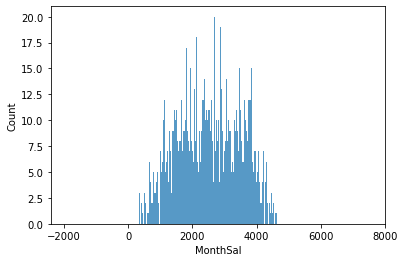

In [29]:
sns.histplot(data=df, x="MonthSal", binwidth=3)
plt.xlim(None, 8000)
plt.show()

After zooming in the histogram, we can see that the variable *MonthSal* has an almost Normal distribution

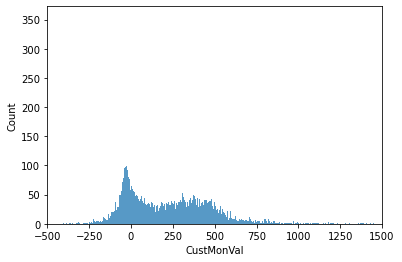

In [30]:
sns.histplot(data=df, x="CustMonVal", binwidth=3)
plt.xlim(-500, 1500)
plt.show()

We can see from the graph that there is a high number of customers with a specific value below zero

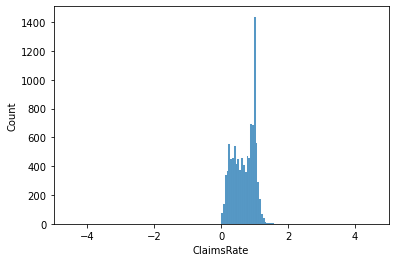

In [31]:
sns.histplot(data=df, x="ClaimsRate")
plt.xlim(-5, 5)
plt.show()

In [32]:
df['ClaimsRate'].value_counts()

1.00     457
1.01     212
1.02     203
0.99     198
1.03     195
        ... 
96.00      1
13.90      1
12.60      1
35.00      1
1.51       1
Name: ClaimsRate, Length: 165, dtype: int64

### Missing Value Detection

<AxesSubplot:>

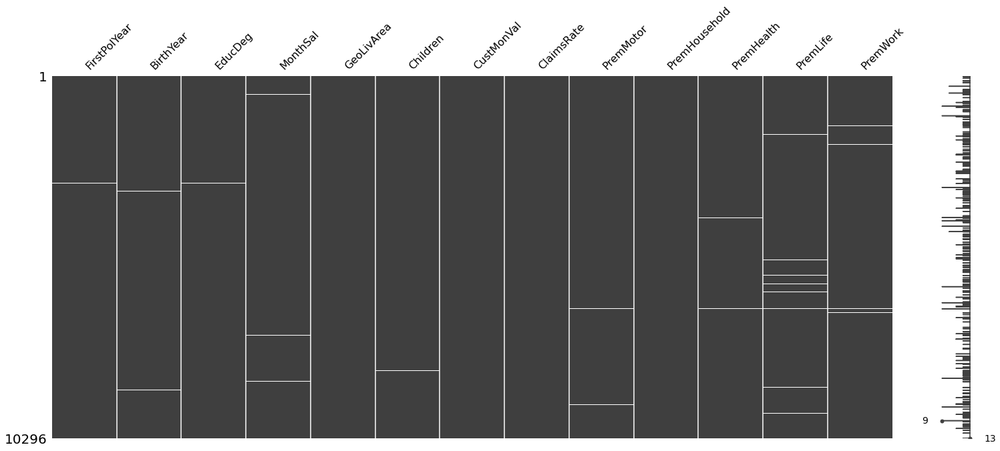

In [33]:
#verify what type of missingness we have
import missingno as msno
msno.matrix(df)
#FirstPolYear and EducDeg are MNAR (Missing Not at Random)

### Variable Relationships

In [34]:
"""
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(df, diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()"""

'\n# Pairwise Relationship of Numerical Variables\nsns.set()\n\n# Setting pairplot\nsns.pairplot(df, diag_kind="hist")\n\n# Layout\nplt.subplots_adjust(top=0.95)\nplt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)\n\nplt.show()'

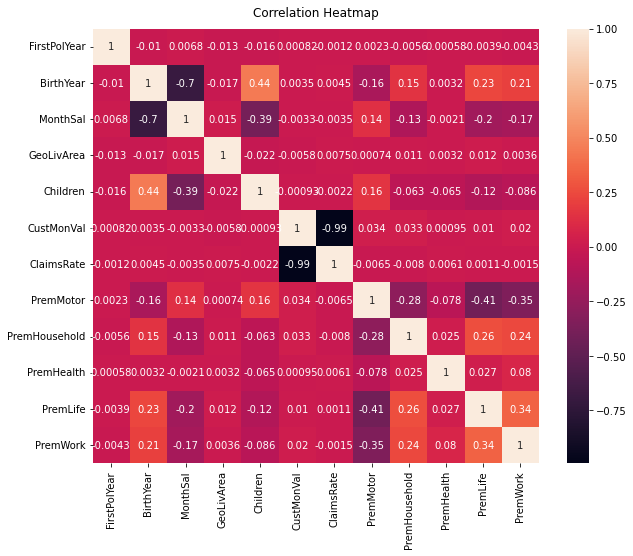

In [35]:
# Pairwise Relationship of Numerical Variables
plt.figure(figsize=(10, 8))
heatmap=sns.heatmap(df.corr(), annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

From the heatmap above, it is evident that there are some variables that are highly linearly correlated. In the code below those relationships are explored in more detail.

<AxesSubplot:xlabel='ClaimsRate', ylabel='CustMonVal'>

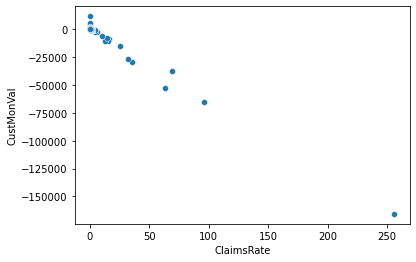

In [36]:
sns.scatterplot(data=df, x='ClaimsRate', y='CustMonVal')

According to the metadata:
- CMV Customer Monetary Value -> Lifetime value = (annual profit from customer) * (nº of years that they are a customer) - (acquisition cost)
- Claims Rate -> Amount paid by the insurance company (€)/ Premiums (€) Note: in the last 2 years



Taking the metadata into account, it makes sense that these variables are so correlated. There are some outliers with one being a very extreme one. This is a person that received much more money from the company than they paid, so they are not profitable to the company.

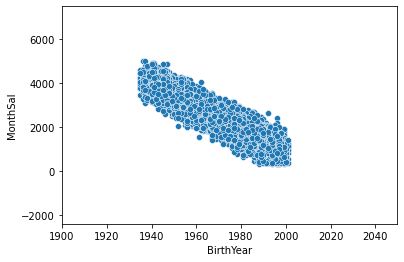

In [37]:
sns.scatterplot(data=df, x='BirthYear', y='MonthSal')
plt.xlim(1900, None)
plt.ylim(None, 7500)
plt.show()
#see in the range without outliers

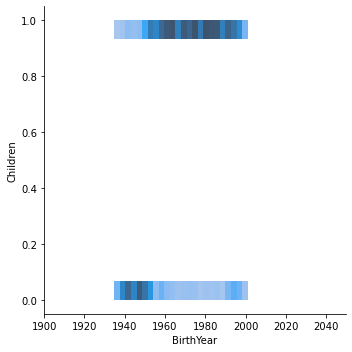

In [38]:
sns.displot(data=df, x='BirthYear', y='Children')
plt.xlim(1900, None)
plt.show()

<AxesSubplot:xlabel='PremLife', ylabel='PremMotor'>

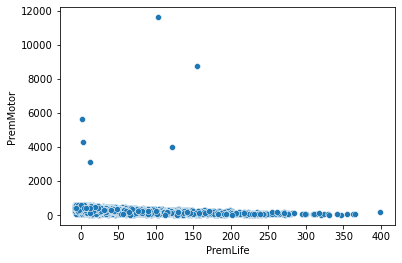

In [39]:
sns.scatterplot(data=df, x='PremLife', y='PremMotor')

In [40]:
from pandas_profiling import ProfileReport
profile = ProfileReport(
    df, 
    title='Insurance Customer Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)

In [41]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 4. Data Cleaning
    
<a name="Cleaning"></a>  
</div>

### New Features

### Outliers

From the previous output there are several conclusions we can take:
- MonthSal: has extreme values (above 30000€). These values are considered outliers, because they are very far from the rest of the distribution.
- CustMonVal: has a skewed distribution. There is an extreme outlier below -150000€.
- ClaimsRate: also has a very skewed distribution, with an outlier above 250
- PremMotor: has several outliers, we can consider above 6000 as an outlier, for example
- PremHousehold: it is a skewed distribution with an extreme outlier 25000+
- PremLife: has a skewed distribution but doesn't seem to have many outliers
- PremWork: has a skewed distribution, with one outlier, above 1750.

In the outlier section we will explore these outliers in more depth and decide on how to handle them.

#### MonthSal

In [42]:
df[df['MonthSal']>30000]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5883.0,1995,1956,2 - High School,55215.0,4,1,122.25,0.79,281.83,147.25,130.58,84.46,66.68
8262.0,1981,1991,2 - High School,34490.0,4,0,608.89,0.28,57.01,358.95,195.26,113.80,161.14


Since there are only 2 observations with this problem, it will not impact the dataset in a major way. So we can remove them.

In [43]:
df= df[df['MonthSal']<=30000]

#### CustMonVal:

In [44]:
df[df['CustMonVal']<-150000]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
172.0,1990,1989,3 - BSc/MSc,1086.0,4,1,-165680.42,256.2,378.07,78.9,166.81,6.89,18.45


There is only 1 observations with this problem and folliwng the same logic as before, we can remove it.

In [45]:
df=df[df['CustMonVal']>=-150000]

#### ClaimsRate

In [46]:
df[df['ClaimsRate']>250]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,


The only example of a client with a Claims Rate above 250 was removed in the CustMonVal handling of the outliers. 

#### PremMotor

In [47]:
df[df['PremMotor']>6000]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5212.0,1981,1943,2 - High School,4135.0,3,0,130.14,0.99,8744.61,101.7,1767.00,155.14,130.58
5294.0,1989,1963,3 - BSc/MSc,3564.0,3,1,11875.89,0.09,11604.42,48.9,1045.52,103.13,296.47


In [48]:
df=df[df['PremMotor']<=6000]

#### PremHousehold

In [49]:
df[df['PremHousehold']>25000]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
8867.0,1978,1972,2 - High School,2618.0,4,1,473.54,0.98,508.43,25048.8,36.23,9.89,11.89


In [50]:
df= df[df['PremHousehold']<=25000]

#### PremWork

In [51]:
df[df['PremWork']>1750]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5085.0,1994,1959,2 - High School,3330.0,3,0,2314.21,0.14,350.51,201.7,125.8,39.23,1988.7


In [52]:
df=df[df['PremWork']<=1750]

### Missing Values

There are several methods that can be used to handle missing values. We will not drop the rows with missing values, because that constitutes a very substantial percentage of the dataset. Other methods include imputing with the median/mode or KNN imputer, which we tried both. 

In [53]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=6)
imp = pd.DataFrame(imputer.fit_transform(df.loc[:, df.columns != 'EducDeg']),index=df.index, columns = df.columns[df.columns != 'EducDeg'])
imp["EducDeg"]= df["EducDeg"]
df=imp
df.head()

,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,EducDeg
CustID,,,,,,,,,,,,,
1.0,1985.0,1982.0,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89,2 - High School
2.0,1981.0,1995.0,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,2 - High School
3.0,1991.0,1970.0,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,1 - Basic
4.0,1990.0,1981.0,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,3 - BSc/MSc
5.0,1986.0,1973.0,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45,3 - BSc/MSc


In [54]:
'''
#df.fillna(0,inplace=True)
from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer(missing_values=np.nan, strategy='median')
df = pd.DataFrame(imp_mean.fit_transform(df.loc[:, df.columns != 'EducDeg']),index=df.index, columns = df.columns[df.columns != 'EducDeg'])
#df['EducDeg'].fillna(df['EducDeg'].mode(),inplace=True)
'''

"\n#df.fillna(0,inplace=True)\nfrom sklearn.impute import SimpleImputer\nimp_mean = SimpleImputer(missing_values=np.nan, strategy='median')\ndf = pd.DataFrame(imp_mean.fit_transform(df.loc[:, df.columns != 'EducDeg']),index=df.index, columns = df.columns[df.columns != 'EducDeg'])\n#df['EducDeg'].fillna(df['EducDeg'].mode(),inplace=True)\n"

In [55]:
mode_educ = df['EducDeg'].mode()[0]
df['EducDeg'].fillna(mode_educ,inplace=True)
df['EducDeg'].isna().sum()

0

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10150 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10150 non-null  float64
 1   BirthYear      10150 non-null  float64
 2   MonthSal       10150 non-null  float64
 3   GeoLivArea     10150 non-null  float64
 4   Children       10150 non-null  float64
 5   CustMonVal     10150 non-null  float64
 6   ClaimsRate     10150 non-null  float64
 7   PremMotor      10150 non-null  float64
 8   PremHousehold  10150 non-null  float64
 9   PremHealth     10150 non-null  float64
 10  PremLife       10150 non-null  float64
 11  PremWork       10150 non-null  float64
 12  EducDeg        10150 non-null  object 
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


### Separating Numerical Variables from Categorical/Binary

In [57]:
df_num=df.select_dtypes('float64')
df_cat = df.select_dtypes(exclude='float64')

In [58]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10150 entries, 1.0 to 10296.0
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10150 non-null  float64
 1   BirthYear      10150 non-null  float64
 2   MonthSal       10150 non-null  float64
 3   GeoLivArea     10150 non-null  float64
 4   Children       10150 non-null  float64
 5   CustMonVal     10150 non-null  float64
 6   ClaimsRate     10150 non-null  float64
 7   PremMotor      10150 non-null  float64
 8   PremHousehold  10150 non-null  float64
 9   PremHealth     10150 non-null  float64
 10  PremLife       10150 non-null  float64
 11  PremWork       10150 non-null  float64
dtypes: float64(12)
memory usage: 1.0 MB


### Get Dummies

There is only one categorical variable in this dataset. For the algorithms to be able to handle the variable, we can either transform it into various dummy variables:

In [59]:
df_dummies = pd.get_dummies(df, columns=['EducDeg'], drop_first=True)

Or we can transform into a numerical variable, since the variable is ordinal. Taking into account that the categories themselves are already numbered, we only need to erase the characters after the number and convert the variable into int type.

In [60]:
df['EducDeg'] = df['EducDeg'].str.split().str[0].astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10150 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10150 non-null  float64
 1   BirthYear      10150 non-null  float64
 2   MonthSal       10150 non-null  float64
 3   GeoLivArea     10150 non-null  float64
 4   Children       10150 non-null  float64
 5   CustMonVal     10150 non-null  float64
 6   ClaimsRate     10150 non-null  float64
 7   PremMotor      10150 non-null  float64
 8   PremHousehold  10150 non-null  float64
 9   PremHealth     10150 non-null  float64
 10  PremLife       10150 non-null  float64
 11  PremWork       10150 non-null  float64
 12  EducDeg        10150 non-null  int32  
dtypes: float64(12), int32(1)
memory usage: 1.0 MB


### Scaling of Data

#### Minmax

In [61]:
scaler = MinMaxScaler()
df_minmax = scaler.fit_transform(df[df.columns])
#df=df_minmax.copy()

In [62]:
#df.head()

In [63]:
"""scaler = MinMaxScaler().fit(df[['BirthYear','FirstPolYear','MonthSal','CustMonVal','ClaimsRate','PremHousehold','PremHealth','PremLife','PremWork','PremMotor']])
# this will return an array
df[['BirthYear','FirstPolYear','MonthSal','CustMonVal','ClaimsRate','PremHousehold','PremHealth','PremLife','PremWork','PremMotor']] = scaler.transform(df[['BirthYear','FirstPolYear','MonthSal','CustMonVal','ClaimsRate','PremHousehold','PremHealth','PremLife','PremWork','PremMotor']])
df.head()"""

"scaler = MinMaxScaler().fit(df[['BirthYear','FirstPolYear','MonthSal','CustMonVal','ClaimsRate','PremHousehold','PremHealth','PremLife','PremWork','PremMotor']])\n# this will return an array\ndf[['BirthYear','FirstPolYear','MonthSal','CustMonVal','ClaimsRate','PremHousehold','PremHealth','PremLife','PremWork','PremMotor']] = scaler.transform(df[['BirthYear','FirstPolYear','MonthSal','CustMonVal','ClaimsRate','PremHousehold','PremHealth','PremLife','PremWork','PremMotor']])\ndf.head()"

#### Robust Scaler

In [68]:
scaler = RobustScaler()
df_robust = scaler.fit_transform(df[df.columns])
df[df.columns]=df_robust.copy()

In [69]:
df.head()

,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,EducDeg
CustID,,,,,,,,,,,,,
1.0,-0.083333,0.466667,-0.204603,-0.666667,0.0,0.472265,-0.559322,0.357074,-0.224023,-0.153461,0.447808,-0.193179,-1.0
2.0,-0.416667,0.900000,-1.150378,0.333333,0.0,-0.780211,0.677966,-1.018439,1.175603,-0.428413,3.526514,1.770297,-1.0
3.0,0.416667,0.066667,-0.141551,0.000000,-1.0,0.774806,-0.745763,-0.425206,0.378845,-0.355296,1.269102,1.613861,-2.0
4.0,0.333333,0.433333,-0.884300,0.333333,0.0,-0.501052,0.457627,-0.534320,-0.374065,1.373830,0.204175,0.058746,0.0
5.0,0.000000,0.166667,-0.465637,0.333333,0.0,-0.373334,0.305085,0.185452,-0.355569,0.182282,-0.141545,0.347195,0.0


### Check results

In [70]:
profile = ProfileReport(
    df, 
    title='Insurance Customer Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 5. Feature Selection
    
<a name="Feature_Selection"></a>  
</div>

### PCA 

In [90]:
df_pca = df_num.copy()

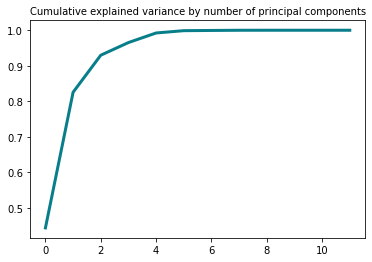

In [91]:
pca = PCA()
pc = pca.fit_transform(df_num)
plt.plot(pca.explained_variance_ratio_.cumsum(), lw=3, color='#087E8B')
plt.title('Cumulative explained variance by number of principal components', size=10)
plt.show()

In [92]:
print(pca.explained_variance_ratio_.cumsum())

[0.44338428 0.82535703 0.92969126 0.9653192  0.99229595 0.99879023
 0.999394   0.99994894 0.99999929 0.99999992 0.99999997 1.        ]


In [93]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=2)
pca_feat = pca.fit_transform(df_num)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1
CustID,,
1.0,-250.509667,259.918290
2.0,-99.752945,1864.991557
3.0,-354.190959,149.961428
4.0,-103.959301,1402.113459
5.0,-5.561022,739.532457
...,...,...
10292.0,348.204449,-639.940590
10293.0,-1221.939317,-156.088127
10294.0,-225.416217,-491.132944


In [94]:
# Reassigning df to contain pca variables
df_pca = pd.concat([df_pca, pca_df], axis=1)
df_pca.head()

,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,PC0,PC1
CustID,,,,,,,,,,,,,,
1.0,1985.0,1982.0,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89,-250.509667,259.918290
2.0,1981.0,1995.0,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,-99.752945,1864.991557
3.0,1991.0,1970.0,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,-354.190959,149.961428
4.0,1990.0,1981.0,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,-103.959301,1402.113459
5.0,1986.0,1973.0,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45,-5.561022,739.532457


In [95]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color
print(df_num.columns)
# Interpreting each Principal Component
loadings = df_pca[list(df_num.columns) + pca_feat_names].corr().loc[df_num, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

Index(['FirstPolYear', 'BirthYear', 'MonthSal', 'GeoLivArea', 'Children',
       'CustMonVal', 'ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth',
       'PremLife', 'PremWork'],
      dtype='object')


KeyError: "None of [Index([     ('F', 'i', 'r', 's', 't', 'P', 'o', 'l', 'Y', 'e', 'a', 'r'),\n                           ('B', 'i', 'r', 't', 'h', 'Y', 'e', 'a', 'r'),\n                                ('M', 'o', 'n', 't', 'h', 'S', 'a', 'l'),\n                      ('G', 'e', 'o', 'L', 'i', 'v', 'A', 'r', 'e', 'a'),\n                                ('C', 'h', 'i', 'l', 'd', 'r', 'e', 'n'),\n                      ('C', 'u', 's', 't', 'M', 'o', 'n', 'V', 'a', 'l'),\n                      ('C', 'l', 'a', 'i', 'm', 's', 'R', 'a', 't', 'e'),\n                           ('P', 'r', 'e', 'm', 'M', 'o', 't', 'o', 'r'),\n       ('P', 'r', 'e', 'm', 'H', 'o', 'u', 's', 'e', 'h', 'o', 'l', 'd'),\n                      ('P', 'r', 'e', 'm', 'H', 'e', 'a', 'l', 't', 'h'),\n                                ('P', 'r', 'e', 'm', 'L', 'i', 'f', 'e'),\n                                ('P', 'r', 'e', 'm', 'W', 'o', 'r', 'k')],\n      dtype='object')] are in the [index]"

In [96]:
df.head()

,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,EducDeg
CustID,,,,,,,,,,,,,
1.0,-0.083333,0.466667,-0.204603,-0.666667,0.0,0.472265,-0.559322,0.357074,-0.224023,-0.153461,0.447808,-0.193179,-1.0
2.0,-0.416667,0.900000,-1.150378,0.333333,0.0,-0.780211,0.677966,-1.018439,1.175603,-0.428413,3.526514,1.770297,-1.0
3.0,0.416667,0.066667,-0.141551,0.000000,-1.0,0.774806,-0.745763,-0.425206,0.378845,-0.355296,1.269102,1.613861,-2.0
4.0,0.333333,0.433333,-0.884300,0.333333,0.0,-0.501052,0.457627,-0.534320,-0.374065,1.373830,0.204175,0.058746,0.0
5.0,0.000000,0.166667,-0.465637,0.333333,0.0,-0.373334,0.305085,0.185452,-0.355569,0.182282,-0.141545,0.347195,0.0


### Define perpectives for our data

In [97]:
df_insurance = df[["FirstPolYear", "CustMonVal", "ClaimsRate", "PremMotor", "PremHousehold", "PremHealth", "PremLife", "PremWork"]]

In [98]:
df_customers = df[["BirthYear", "MonthSal", "GeoLivArea", "Children", "EducDeg"]]

# Hierarchical Clustering

In [100]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

In [101]:
# Performing HC
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=5)
hc_labels = hclust.fit_predict(df)
hc_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [102]:
# Characterizing the clusters
df_concat = pd.concat((df, pd.Series(hc_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,EducDeg
labels,,,,,,,,,,,,,
0.0,0.433848,-0.000831,-0.000839,-0.095971,-0.294285,0.010342,0.000280,-0.001417,0.314749,0.081960,0.337636,0.339482,-0.522018
1.0,-0.135417,-0.050000,0.048471,-0.166667,-0.500000,0.141986,-0.152542,-0.144661,0.169212,0.346411,0.250000,0.405638,-0.125000
2.0,-0.472222,-0.188889,0.333018,-0.333333,0.000000,0.390878,-0.406780,0.221654,0.564284,-0.460353,0.499582,0.307297,-0.666667
3.0,-0.166667,0.900000,-0.659206,0.000000,0.000000,1.588561,-0.830508,-1.199788,2.279510,0.356315,-0.062630,3.408581,-1.000000
4.0,-0.833333,0.166667,-0.278373,-0.333333,0.000000,0.421980,-0.508475,0.519983,-0.122402,-0.071078,-0.433820,-0.718812,0.000000


### Defining the linkage method to choose

In [107]:
# Computing SST
X = df.values
sst = np.sum(np.square(X - X.mean(axis=0)), axis=0)

# Computing SSW
ssw_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssw_iter.append(np.sum(np.square(X_k - X_k.mean(axis=0)), axis=0))
ssw = np.sum(ssw_iter, axis=0)

# Computing SSB
ssb_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssb_iter.append(X_k.shape[0] * np.square(X_k.mean(axis=0) - X.mean(axis=0)))
ssb = np.sum(ssb_iter, axis=0)

# Verifying the formula
np.round(sst) == np.round((ssw + ssb))

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [108]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(df) #get cluster labels
        
        
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

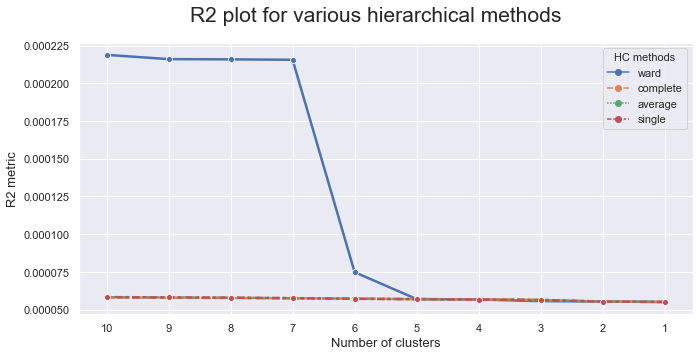

In [110]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack(
    [
        get_r2_hc(df=df, link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

### Number of Clusters

In [111]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df)

array([6574, 6002, 5533, ...,    1,    2,    0], dtype=int64)

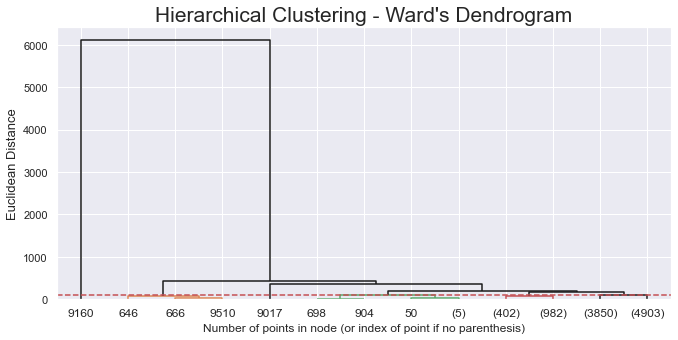

In [112]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 100
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()